<div style="display: flex; align-items: center; justify-content: space-between">
    <div>
        <img src="https://raw.githubusercontent.com/sebastianVP/RADAR_AMISR/refs/heads/main/igp_logo.jpeg"
         alt="LOGO IGP" width="200" height="200" style="margin-left: 20px; border-radius: 10px;" align = "right">
        <h1 style="color: #800020;  font-weight: bold; margin-bottom: 10px; font-family: Arial, sans-serif;">
          <font color="#7F000E">
            Maestría de Ciencias de la Computación UNI-IGP
          </font>
        </h1>
        <h2 style="color: #800020;font-weight: bold; max-width: 750px; font-family: Arial, sans-serif;">
          <strong><font color="#7F000E" size=5 >
            Desarrollo de sistema de pronóstico de centelleo ionosférico sobre el Perú para alerta de
            perturbaciones en señales satelitales
          </font ></strong>
        </h2>
    </div>
</div>
<div>
    <p style="margin-bottom: 5px;">
    <strong>
    <font color="#7F000E" size=4 >Avance de Tesis </strong></p>
    <p style="margin-bottom: 5px;">
    <font color="#7F000E"><strong>Alumno:</strong></font>
    <font color="#7F000E"> Alexander Valdez Portocarrero</p>
    <p style="margin-bottom: 5px;">
    <font color="#7F000E"><strong>Código:</strong> 20207072E</p>
    <p style="margin-bottom: 5px;">
    <font color="#7F000E"><strong>Fecha:</strong>  20/06/2025</p>
    <p style="margin-bottom: 5px;">
    <font color="#7F000E"><strong> Ciclo 2025-1</strong></p>
</div>

---

In [1]:
!pip install scikit-learn

In [4]:
!pip install tensorflow

In [6]:
import pandas as pd

# **LEAMOS EL DATASET FINAL**

In [8]:
df =  pd.read_csv("df_FINAL.csv")

In [10]:
df.head()

,Tiempo,Cintilacion,Azimuth,Elevacion,TEC,ROTEC,ROTI,Kp_Index,Dst_Index,ap_Index,f10.7_Index,AE_Index,S4
0,2025-01-26 00:35:00,0.0,189.0,31.0,69.258790,-0.020608,0.010838,3.0,-1.416667,2.0,165.4,29.083333,0.161
1,2025-01-26 00:36:00,0.0,189.0,32.0,68.826191,-0.019268,0.010848,3.0,-1.400000,2.0,165.4,29.000000,0.122
2,2025-01-26 00:37:00,0.0,197.0,32.0,68.393592,-0.017928,0.010858,3.0,-1.383333,2.0,165.4,28.916667,0.128
3,2025-01-26 00:38:00,0.0,189.0,33.0,67.960993,-0.016589,0.010867,3.0,-1.366667,2.0,165.4,28.833333,0.106
4,2025-01-26 00:39:00,0.0,196.0,32.0,67.528394,-0.015249,0.010877,3.0,-1.350000,2.0,165.4,28.750000,0.103


In [12]:
df["Tiempo"] = pd.to_datetime(df["Tiempo"])


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197900 entries, 0 to 197899
Data columns (total 11 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Tiempo       197900 non-null  datetime64[ns]
 1   Cintilacion  197900 non-null  float64       
 2   TEC          197900 non-null  float64       
 3   ROTEC        197900 non-null  float64       
 4   ROTI         197900 non-null  float64       
 5   Kp_Index     197900 non-null  float64       
 6   Dst_Index    197900 non-null  float64       
 7   ap_Index     197900 non-null  float64       
 8   f10.7_Index  197900 non-null  float64       
 9   AE_Index     197900 non-null  float64       
 10  S4           197900 non-null  float64       
dtypes: datetime64[ns](1), float64(10)
memory usage: 16.6 MB


In [18]:
df.describe()

,Tiempo,Cintilacion,TEC,ROTEC,ROTI,Kp_Index,Dst_Index,ap_Index,f10.7_Index,AE_Index,S4
count,197900,197900.000000,197900.000000,197900.000000,197900.000000,197900.000000,197900.000000,197900.000000,197900.000000,197900.000000,197900.000000
mean,2025-04-09 02:13:37.251540992,0.001945,57.871489,-0.001410,0.001924,26.946100,-17.777615,17.160172,158.309589,572.629316,0.136533
min,2025-01-26 00:35:00,0.000000,5.438763,-0.023304,0.000065,0.000000,-138.000000,0.000000,117.900000,15.000000,0.038000
25%,2025-03-04 14:07:45,0.000000,42.672811,-0.004785,0.001228,17.000000,-28.833333,6.000000,146.100000,97.933333,0.106000
50%,2025-04-08 08:42:30,0.000000,60.029780,-0.001730,0.001948,27.000000,-15.500000,12.000000,157.800000,232.333333,0.126000
75%,2025-05-15 09:10:15,0.000000,70.677309,0.001196,0.001948,37.000000,-2.000000,22.000000,170.800000,452.100000,0.150000
max,2025-06-19 23:45:00,1.000000,126.933200,0.035445,0.020087,77.000000,58.000000,179.000000,234.900000,9999.000000,1.293000
std,NaN,0.044064,22.751701,0.003562,0.001260,13.765593,22.565569,18.762874,21.555142,1642.101655,0.060065


## **NUMERO DE DIAS TOTALES Y DE EVENTO**

In [25]:
df["dias"] = df["Tiempo"].dt.date

In [28]:
print(f"Numero de didas totales: {df["dias"].nunique()}")

Numero de didas totales: 142


In [31]:
# Filtrar y crear copia del DataFrame con cintilación
df_con_cintilacion = df[df['Cintilacion'] == 1].copy()

In [34]:
# Extraer solo la fecha (sin hora)
df_con_cintilacion['Fecha'] = df_con_cintilacion['Tiempo'].dt.date

# Contar los días únicos con cintilación
dias_con_cintilacion = df_con_cintilacion['Fecha'].nunique()

print(f"Número de días con cintilación: {dias_con_cintilacion}")

Número de días con cintilación: 29


In [37]:
dias_unicos = pd.Series(df_con_cintilacion["Fecha"].unique())
dias_unicos

0     2025-01-28
1     2025-01-30
2     2025-01-31
3     2025-02-01
4     2025-02-04
5     2025-02-05
6     2025-02-06
7     2025-02-07
8     2025-02-08
9     2025-02-09
10    2025-02-11
11    2025-02-12
12    2025-02-13
13    2025-02-14
14    2025-02-21
15    2025-02-25
16    2025-02-26
17    2025-03-06
18    2025-03-07
19    2025-03-08
20    2025-03-12
21    2025-03-13
22    2025-03-14
23    2025-03-16
24    2025-03-18
25    2025-03-22
26    2025-03-30
27    2025-04-02
28    2025-04-03
dtype: object

## **INDENTIFICA LOS DIAS CON TEC Y ROTI, QUE PRESENTAN CINTILACION**

In [80]:
df_FINAL= pd.read_csv("df_FINAL.csv")
df_FINAL["Tiempo"] = pd.to_datetime(df_FINAL["Tiempo"])

df_FINAL.head()

,Tiempo,Cintilacion,TEC,ROTEC,ROTI,Kp_Index,Dst_Index,ap_Index,f10.7_Index,AE_Index,S4
0,2025-01-26 00:35:00,0.0,69.258790,-0.020608,0.010838,3.0,-1.416667,2.0,165.4,29.083333,0.161
1,2025-01-26 00:36:00,0.0,68.826191,-0.019268,0.010848,3.0,-1.400000,2.0,165.4,29.000000,0.122
2,2025-01-26 00:37:00,0.0,68.393592,-0.017928,0.010858,3.0,-1.383333,2.0,165.4,28.916667,0.128
3,2025-01-26 00:38:00,0.0,67.960993,-0.016589,0.010867,3.0,-1.366667,2.0,165.4,28.833333,0.106
4,2025-01-26 00:39:00,0.0,67.528394,-0.015249,0.010877,3.0,-1.350000,2.0,165.4,28.750000,0.103


In [82]:
df_new = df_FINAL.set_index('Tiempo').copy()

In [84]:
df_new.head()

,Cintilacion,TEC,ROTEC,ROTI,Kp_Index,Dst_Index,ap_Index,f10.7_Index,AE_Index,S4
Tiempo,,,,,,,,,,
2025-01-26 00:35:00,0.0,69.258790,-0.020608,0.010838,3.0,-1.416667,2.0,165.4,29.083333,0.161
2025-01-26 00:36:00,0.0,68.826191,-0.019268,0.010848,3.0,-1.400000,2.0,165.4,29.000000,0.122
2025-01-26 00:37:00,0.0,68.393592,-0.017928,0.010858,3.0,-1.383333,2.0,165.4,28.916667,0.128
2025-01-26 00:38:00,0.0,67.960993,-0.016589,0.010867,3.0,-1.366667,2.0,165.4,28.833333,0.106
2025-01-26 00:39:00,0.0,67.528394,-0.015249,0.010877,3.0,-1.350000,2.0,165.4,28.750000,0.103


In [86]:
dias_unicos = pd.to_datetime(dias_unicos)

In [88]:
df_new.index.normalize()

DatetimeIndex(['2025-01-26', '2025-01-26', '2025-01-26', '2025-01-26',
               '2025-01-26', '2025-01-26', '2025-01-26', '2025-01-26',
               '2025-01-26', '2025-01-26',
               ...
               '2025-06-19', '2025-06-19', '2025-06-19', '2025-06-19',
               '2025-06-19', '2025-06-19', '2025-06-19', '2025-06-19',
               '2025-06-19', '2025-06-19'],
              dtype='datetime64[ns]', name='Tiempo', length=197900, freq=None)

In [91]:
df_FINAL_CINT = df_new[df_new.index.normalize().isin(dias_unicos)]


In [94]:
df_FINAL_CINT.head()

,Cintilacion,TEC,ROTEC,ROTI,Kp_Index,Dst_Index,ap_Index,f10.7_Index,AE_Index,S4
Tiempo,,,,,,,,,,
2025-01-28 00:01:00,0.0,71.649570,-0.006873,0.010323,20.0,-0.016667,7.0,166.3,97.8,0.093
2025-01-28 00:02:00,0.0,71.544307,-0.006454,0.010285,20.0,-0.033333,7.0,166.3,98.6,0.080
2025-01-28 00:03:00,0.0,71.439044,-0.006034,0.010248,20.0,-0.050000,7.0,166.3,99.4,0.122
2025-01-28 00:04:00,0.0,71.333781,-0.005614,0.010211,20.0,-0.066667,7.0,166.3,100.2,0.080
2025-01-28 00:05:00,0.0,71.228518,-0.005194,0.010174,20.0,-0.083333,7.0,166.3,101.0,0.086


In [98]:
df_FINAL_CINT.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 40838 entries, 2025-01-28 00:01:00 to 2025-04-03 23:45:00
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Cintilacion  40838 non-null  float64
 1   TEC          40838 non-null  float64
 2   ROTEC        40838 non-null  float64
 3   ROTI         40838 non-null  float64
 4   Kp_Index     40838 non-null  float64
 5   Dst_Index    40838 non-null  float64
 6   ap_Index     40838 non-null  float64
 7   f10.7_Index  40838 non-null  float64
 8   AE_Index     40838 non-null  float64
 9   S4           40838 non-null  float64
dtypes: float64(10)
memory usage: 3.4 MB


In [101]:
df_FINAL_CINT= df_FINAL_CINT.reset_index()

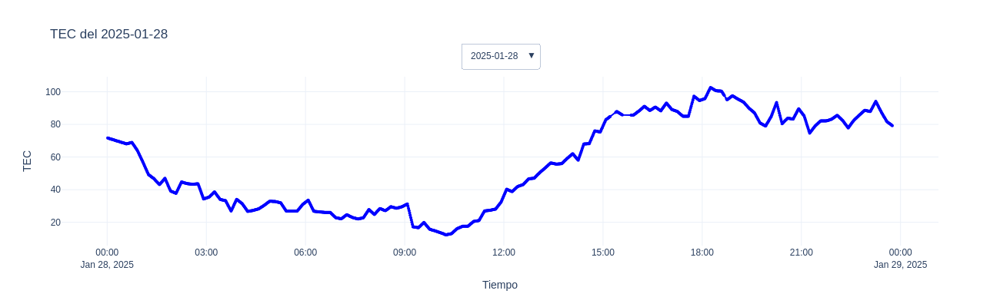

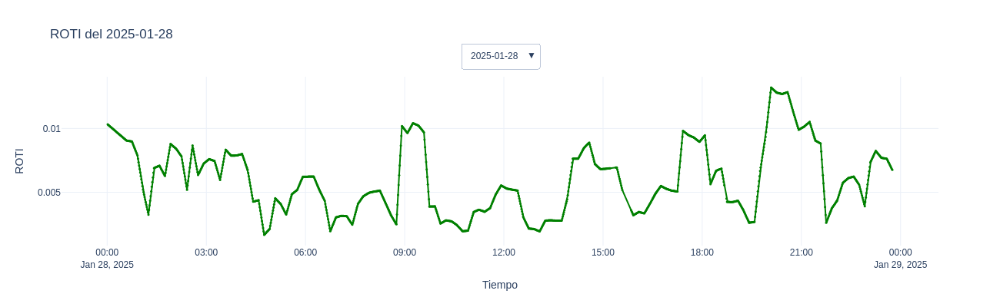

In [104]:
import pandas as pd
import plotly.graph_objects as go
from datetime import timedelta

# ---------------------------
# datos
# ---------------------------
df = df_FINAL_CINT.copy()

# ---------------------------
# Preparar formato
# ---------------------------
df['Tiempo'] = pd.to_datetime(df['Tiempo'])
df['Fecha'] = df['Tiempo'].dt.date
fechas_unicas = sorted(df['Fecha'].unique())
n_fechas = len(fechas_unicas)

# ---------------------------
# Construir trazas y botones
# ---------------------------
trazas_tec = []
trazas_roti = []
botones_fechas_tec = []
botones_fechas_roti = []

for i, fecha in enumerate(fechas_unicas):
    inicio = pd.to_datetime(fecha)
    fin = inicio + timedelta(days=1)
    df_dia = df[(df['Tiempo'] >= inicio) & (df['Tiempo'] < fin)]

    # TEC
    trazas_tec.append(go.Scatter(
        x=df_dia['Tiempo'], y=df_dia['TEC'],
        mode='lines+markers',
        name=f'TEC - {fecha}',
        marker=dict(size=4, color='blue'),
        visible=(i == 0)
    ))

    # ROTI
    trazas_roti.append(go.Scatter(
        x=df_dia['Tiempo'], y=df_dia['ROTI'],
        mode='lines+markers',
        name=f'ROTI - {fecha}',
        marker=dict(size=3, color='green'),
        visible=(i == 0)
    ))

    # Botones
    vis_tec = [False] * n_fechas
    vis_roti = [False] * n_fechas
    vis_tec[i] = True
    vis_roti[i] = True

    botones_fechas_tec.append(dict(
        label=str(fecha),
        method="update",
        args=[{"visible": vis_tec},
              {"title": f"TEC del {fecha}"}]
    ))

    botones_fechas_roti.append(dict(
        label=str(fecha),
        method="update",
        args=[{"visible": vis_roti},
              {"title": f"ROTI del {fecha}"}]
    ))

# ---------------------------
# Crear gráfico TEC
# ---------------------------
fig_tec = go.Figure(data=trazas_tec)
fig_tec.update_layout(
    title=f"TEC del {fechas_unicas[0]}",
    xaxis_title="Tiempo",
    yaxis_title="TEC",
    template='plotly_white',
    updatemenus=[
        dict(
            buttons=botones_fechas_tec,
            direction="down",
            showactive=True,
            x=0.5,
            y=1.2,
            xanchor="center",
            yanchor="top"
        )
    ],
    height=400
)

# ---------------------------
# Crear gráfico ROTI
# ---------------------------
fig_roti = go.Figure(data=trazas_roti)
fig_roti.update_layout(
    title=f"ROTI del {fechas_unicas[0]}",
    xaxis_title="Tiempo",
    yaxis_title="ROTI",
    template='plotly_white',
    updatemenus=[
        dict(
            buttons=botones_fechas_roti,
            direction="down",
            showactive=True,
            x=0.5,
            y=1.2,
            xanchor="center",
            yanchor="top"
        )
    ],
    height=400
)

# ---------------------------
# Mostrar los gráficos
# ---------------------------
fig_tec.show()
fig_roti.show()

# **TRABAJANDO EL MODELO LSTM Y EL DATASET FINAL**

Vamos a implementar 2 modelos 
1. Modelo 1: Solo vamos a tomar en cuenta el parametros S4.
2. Modelo 2: Vamos a tomar en cuenta los parametros TEC, ROTI, Kp_Index, Dst_Index, ap_Index, f10.7_Index,AE_Index y S4

# **MODELO 1**

# **PASO 1: Importamos librerias**

In [128]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

In [132]:
df.head()

,Tiempo,Cintilacion,TEC,ROTEC,ROTI,Kp_Index,Dst_Index,ap_Index,f10.7_Index,AE_Index,S4,Fecha
0,2025-01-28 00:01:00,0.0,71.649570,-0.006873,0.010323,20.0,-0.016667,7.0,166.3,97.8,0.093,2025-01-28
1,2025-01-28 00:02:00,0.0,71.544307,-0.006454,0.010285,20.0,-0.033333,7.0,166.3,98.6,0.080,2025-01-28
2,2025-01-28 00:03:00,0.0,71.439044,-0.006034,0.010248,20.0,-0.050000,7.0,166.3,99.4,0.122,2025-01-28
3,2025-01-28 00:04:00,0.0,71.333781,-0.005614,0.010211,20.0,-0.066667,7.0,166.3,100.2,0.080,2025-01-28
4,2025-01-28 00:05:00,0.0,71.228518,-0.005194,0.010174,20.0,-0.083333,7.0,166.3,101.0,0.086,2025-01-28


In [135]:
data =df[["Tiempo","S4"]]

In [139]:
data.head()

,Tiempo,S4
0,2025-01-28 00:01:00,0.093
1,2025-01-28 00:02:00,0.080
2,2025-01-28 00:03:00,0.122
3,2025-01-28 00:04:00,0.080
4,2025-01-28 00:05:00,0.086


**Tengamos en cuenta este detalle que se estan considerando 88460 muestras.**

In [144]:
data = data[:88460]

In [147]:
data.head()

,Tiempo,S4
0,2025-01-28 00:01:00,0.093
1,2025-01-28 00:02:00,0.080
2,2025-01-28 00:03:00,0.122
3,2025-01-28 00:04:00,0.080
4,2025-01-28 00:05:00,0.086


In [150]:
data.set_index('Tiempo', inplace=True)


In [154]:
# NORMALIZAR
scaler= MinMaxScaler()
data["S4_SCALED"]=scaler.fit_transform(data)

In [156]:
data.head()

,S4,S4_SCALED
Tiempo,,
2025-01-28 00:01:00,0.093,0.039231
2025-01-28 00:02:00,0.080,0.028823
2025-01-28 00:03:00,0.122,0.062450
2025-01-28 00:04:00,0.080,0.028823
2025-01-28 00:05:00,0.086,0.033627


In [160]:
# Crear datos supervisados
############################################################################
# ANALIZAR MAS A DETALLE EL HIPOTESIS DE LOS DATOS DE ENTRADA Y LA SALIDA
# EN QUE CONSISTE LOS DATOS DE ENTRADA
############################################################################

def create_sequences(data, n_steps, horizon):
    X, y = [], []
    for i in range(len(data) - n_steps - horizon):
        X.append(data[i:i+n_steps])
        y.append(data[i+n_steps+horizon])
    return np.array(X), np.array(y)

n_steps = 10  # Minutos pasados
horizon = 5  # Horizonte de predicción
X, y = create_sequences(data['S4_SCALED'].values, n_steps, horizon)

# Dividir en entrenamiento y prueba
split = int(0.8 * len(X))
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

In [163]:
X_train.shape

(32658, 10)

In [166]:
X_test.shape

(8165, 10)

In [169]:
y_train.shape

(32658,)

In [173]:
# Crear modelo LSTM
model = Sequential([
    LSTM(50, activation='relu', input_shape=(n_steps, 1)),
    Dense(1)
])
model.compile(optimizer='adam', loss='mse')

# Entrenar modelo
model.fit(X_train, y_train, epochs=5, batch_size=32, validation_split=0.2)

I0000 00:00:1752473331.236380  412298 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 856 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4080 SUPER, pci bus id: 0000:01:00.0, compute capability: 8.9
/home/soporte/anaconda3/envs/s4_env/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/5


I0000 00:00:1752473332.182098  416000 service.cc:152] XLA service 0x7b71c0004c20 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1752473332.182113  416000 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4080 SUPER, Compute Capability 8.9
2025-07-14 01:08:52.201881: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1752473332.325291  416000 cuda_dnn.cc:529] Loaded cuDNN version 90800


 83/817 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0079

I0000 00:00:1752473332.598393  416000 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


817/817 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.0030 - val_loss: 0.0033
Epoch 2/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0019 - val_loss: 0.0032
Epoch 3/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0018 - val_loss: 0.0031
Epoch 4/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0018 - val_loss: 0.0031
Epoch 5/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017 - val_loss: 0.0031


In [175]:
# Hacer predicciones
y_pred = model.predict(X_test)

256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


In [184]:
y_pred_inv = scaler.inverse_transform(y_pred)  # Volver a la escala original

In [187]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1))

# Calcular métricas
mae = mean_absolute_error(y_test_original, y_pred_inv)
rmse = np.sqrt(mean_squared_error(y_test_original, y_pred_inv))
mape = mean_absolute_percentage_error(y_test_original, y_pred_inv)

print(f"MAE: {mae:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"MAPE: {mape:.3f}")

MAE: 0.034
RMSE: 0.055
MAPE: 0.243


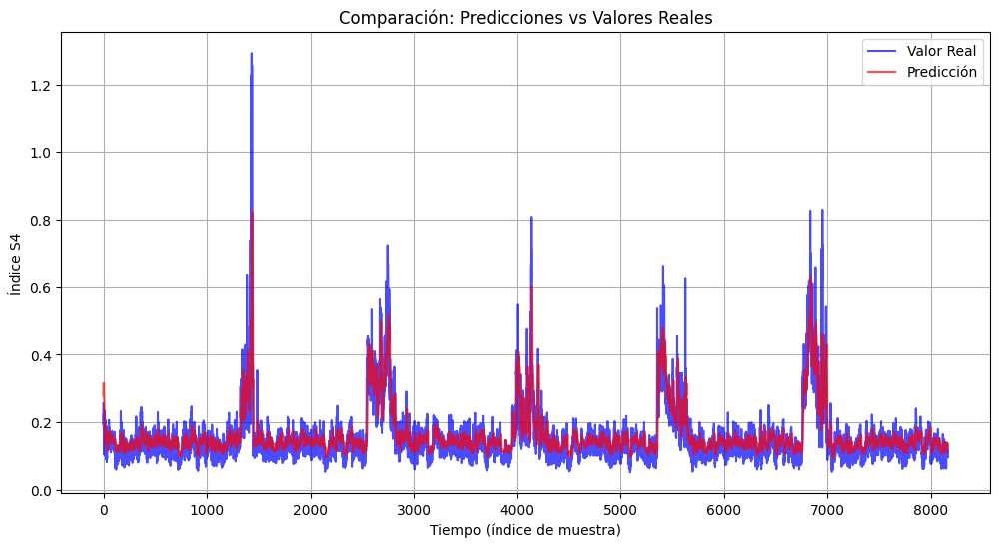

In [190]:
import matplotlib.pyplot as plt

# Gráfica de predicciones vs valores reales
plt.figure(figsize=(12, 6))
plt.plot(y_test_original, label="Valor Real", color="blue", alpha=0.7)
plt.plot(y_pred_inv, label="Predicción", color="red", alpha=0.7)
plt.title("Comparación: Predicciones vs Valores Reales")
plt.xlabel("Tiempo (índice de muestra)")
plt.ylabel("Índice S4")
plt.legend()
plt.grid(True)
plt.show()

In [193]:
y_test_original

array([[0.256],
       [0.193],
       [0.197],
       ...,
       [0.096],
       [0.113],
       [0.116]], shape=(8165, 1))

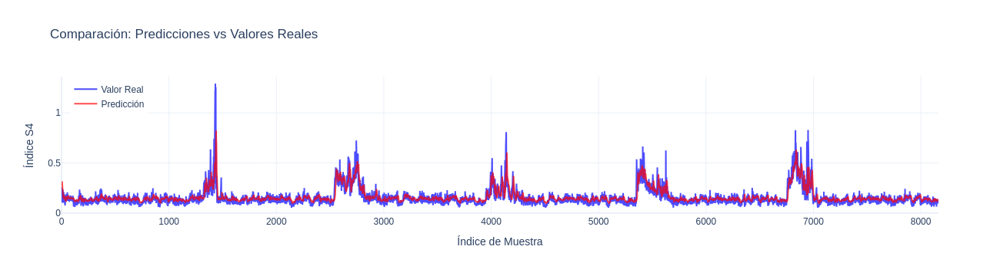

In [196]:
import plotly.graph_objects as go

# Crear el eje X basado en el índice de muestra
# Asegurarse de que sean arrays planos y del mismo tamaño
y_real = np.ravel(y_test_original)
y_pred = np.ravel(y_pred_inv)
x_vals = list(range(len(y_test_original)))

# Crear figura interactiva
fig = go.Figure()

# Trazar valores reales
fig.add_trace(go.Scatter(
    x=x_vals,
    y=y_real,
    mode='lines',
    name='Valor Real',
    line=dict(color='blue'),
    opacity=0.7
))

# Trazar predicciones
fig.add_trace(go.Scatter(
    x=x_vals,
    y=y_pred,
    mode='lines',
    name='Predicción',
    line=dict(color='red'),
    opacity=0.7
))

# Personalización del gráfico
fig.update_layout(
    title='Comparación: Predicciones vs Valores Reales',
    xaxis_title='Índice de Muestra',
    yaxis_title='Índice S4',
    legend=dict(x=0.01, y=0.99),
    template='plotly_white',
    hovermode='x unified'
)

fig.show()

# **MODELO 2**

In [202]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

In [205]:
df.head()

,Tiempo,Cintilacion,TEC,ROTEC,ROTI,Kp_Index,Dst_Index,ap_Index,f10.7_Index,AE_Index,S4,Fecha
0,2025-01-28 00:01:00,0.0,71.649570,-0.006873,0.010323,20.0,-0.016667,7.0,166.3,97.8,0.093,2025-01-28
1,2025-01-28 00:02:00,0.0,71.544307,-0.006454,0.010285,20.0,-0.033333,7.0,166.3,98.6,0.080,2025-01-28
2,2025-01-28 00:03:00,0.0,71.439044,-0.006034,0.010248,20.0,-0.050000,7.0,166.3,99.4,0.122,2025-01-28
3,2025-01-28 00:04:00,0.0,71.333781,-0.005614,0.010211,20.0,-0.066667,7.0,166.3,100.2,0.080,2025-01-28
4,2025-01-28 00:05:00,0.0,71.228518,-0.005194,0.010174,20.0,-0.083333,7.0,166.3,101.0,0.086,2025-01-28


In [208]:
data_m2 =df.drop(columns=["Cintilacion","Fecha"])

In [211]:
data_m2.head()

,Tiempo,TEC,ROTEC,ROTI,Kp_Index,Dst_Index,ap_Index,f10.7_Index,AE_Index,S4
0,2025-01-28 00:01:00,71.649570,-0.006873,0.010323,20.0,-0.016667,7.0,166.3,97.8,0.093
1,2025-01-28 00:02:00,71.544307,-0.006454,0.010285,20.0,-0.033333,7.0,166.3,98.6,0.080
2,2025-01-28 00:03:00,71.439044,-0.006034,0.010248,20.0,-0.050000,7.0,166.3,99.4,0.122
3,2025-01-28 00:04:00,71.333781,-0.005614,0.010211,20.0,-0.066667,7.0,166.3,100.2,0.080
4,2025-01-28 00:05:00,71.228518,-0.005194,0.010174,20.0,-0.083333,7.0,166.3,101.0,0.086


In [215]:
data_m2.set_index('Tiempo', inplace=True)

# **NORMALIZAR**


In [220]:
scaler= MinMaxScaler()
data_m2_Scaled = scaler.fit_transform(data_m2)

In [223]:
target_index = data_m2.columns.get_loc('S4')
print(target_index)

8


In [226]:
df_scaled_visual = pd.DataFrame(data_m2_Scaled, columns=data_m2.columns, index=data_m2.index)
df_scaled_visual.head()

,TEC,ROTEC,ROTI,Kp_Index,Dst_Index,ap_Index,f10.7_Index,AE_Index,S4
Tiempo,,,,,,,,,
2025-01-28 00:01:00,0.570754,0.29384,0.732227,0.350877,0.666498,0.104478,0.35313,0.073144,0.039231
2025-01-28 00:02:00,0.569814,0.30135,0.729550,0.350877,0.666330,0.104478,0.35313,0.073877,0.028823
2025-01-28 00:03:00,0.568874,0.30886,0.726873,0.350877,0.666162,0.104478,0.35313,0.074610,0.062450
2025-01-28 00:04:00,0.567934,0.31637,0.724197,0.350877,0.665993,0.104478,0.35313,0.075344,0.028823
2025-01-28 00:05:00,0.566994,0.32388,0.721520,0.350877,0.665825,0.104478,0.35313,0.076077,0.033627


In [230]:
data_m2_Scaled.shape

(40838, 9)

In [233]:
# Crear datos supervisados
############################################################################
# ANALIZAR MAS A DETALLE EL HIPOTESIS DE LOS DATOS DE ENTRADA Y LA SALIDA
# EN QUE CONSISTE LOS DATOS DE ENTRADA
############################################################################

def create_sequences(data, n_steps, horizon):
    X, y = [], []
    for i in range(len(data) - n_steps - horizon):
        X.append(data[i:i+n_steps])
        y.append(data[i+n_steps+horizon,-1])
    return np.array(X), np.array(y)

n_steps = 10  # Minutos pasados
horizon = 5  # Horizonte de predicción
X, y = create_sequences(data_m2_Scaled, n_steps, horizon)

# Dividir en entrenamiento y prueba
split = int(0.8 * len(X))
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

In [237]:
X_train.shape

(32658, 10, 9)

In [239]:
y_train.shape

(32658,)

# **LSTM OBSERVACIONES**

* Si usas loss='mse', estás penalizando más los errores grandes, pero no forzando la captura de picos.
* Podemos usar una custom loss para penalizar más los errores en picos, como:

In [246]:
from tensorflow.keras.layers import Dropout

# Crear modelo LSTM
model = Sequential([
    #LSTM(128, activation='relu', input_shape=(n_steps, 9)), # 50
    LSTM(128, return_sequences=True, input_shape=(n_steps, 9)),
    Dropout(0.2),#
    LSTM(64),#
    Dense(1)
])
model.compile(optimizer='adam', loss='mse')

# Entrenar modelo
model.fit(X_train, y_train, epochs=5, batch_size=32, validation_split=0.2)

Epoch 1/5


/home/soporte/anaconda3/envs/s4_env/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



817/817 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.0019 - val_loss: 0.0034
Epoch 3/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0019 - val_loss: 0.0032
Epoch 4/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0018 - val_loss: 0.0036
Epoch 5/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.0019 - val_loss: 0.0035


In [249]:
# Hacer predicciones
y_pred = model.predict(X_test)

256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step


In [252]:
s4_scaler = MinMaxScaler()
s4_scaler.min_,s4_scaler.scale_= scaler.min_[target_index],scaler.scale_[target_index]

In [255]:
y_test_original = y_test * s4_scaler.scale_ + s4_scaler.min_
y_pred_original = y_pred * s4_scaler.scale_ + s4_scaler.min_

In [258]:
#  Métricas
mae = mean_absolute_error(y_test_original, y_pred_original)
rmse = np.sqrt(mean_squared_error(y_test_original, y_pred_original))
mape = mean_absolute_percentage_error(y_test_original, y_pred_original)

print(f"MAE: {mae:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"MAPE: {mape:.3f}")

MAE: 0.022
RMSE: 0.035
MAPE: 8.439


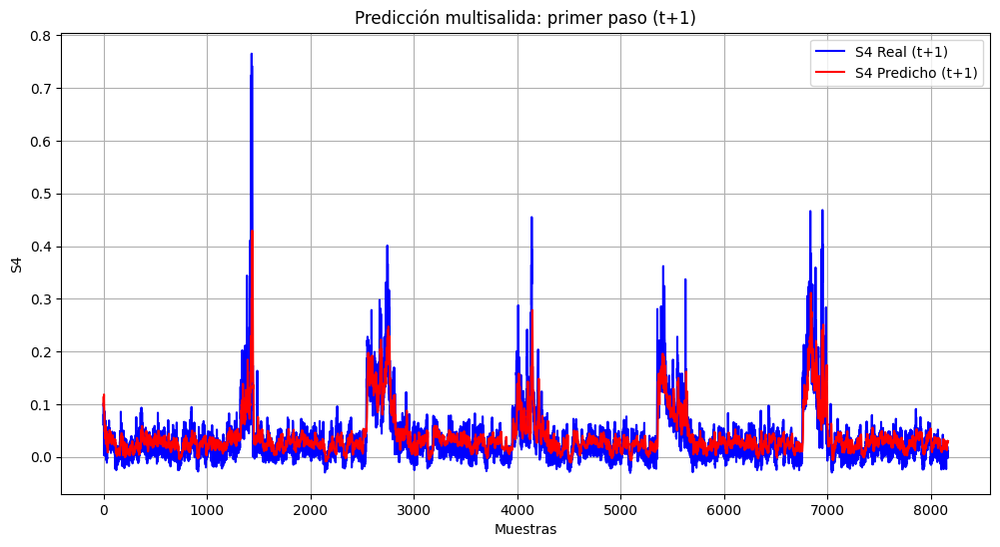

In [262]:
# Gráfico del primer paso
plt.figure(figsize=(12, 6))
plt.plot(y_test_original, label='S4 Real (t+1)', color='blue')
plt.plot(y_pred_original, label='S4 Predicho (t+1)', color='red')
plt.title("Predicción multisalida: primer paso (t+1)")
plt.xlabel("Muestras")
plt.ylabel("S4")
plt.legend()
plt.grid(True)
plt.show()

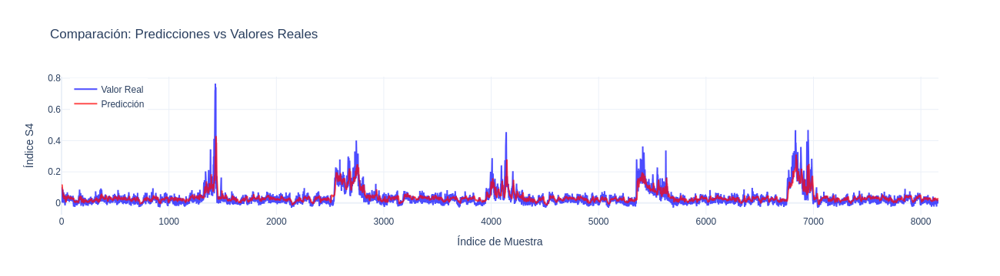

In [265]:
import plotly.graph_objects as go

# Crear el eje X basado en el índice de muestra
# Asegurarse de que sean arrays planos y del mismo tamaño
y_real = np.ravel(y_test_original)
y_pred = np.ravel(y_pred_original)
x_vals = list(range(len(y_test_original)))

# Crear figura interactiva
fig = go.Figure()

# Trazar valores reales
fig.add_trace(go.Scatter(
    x=x_vals,
    y=y_real,
    mode='lines',
    name='Valor Real',
    line=dict(color='blue'),
    opacity=0.7
))

# Trazar predicciones
fig.add_trace(go.Scatter(
    x=x_vals,
    y=y_pred,
    mode='lines',
    name='Predicción',
    line=dict(color='red'),
    opacity=0.7
))

# Personalización del gráfico
fig.update_layout(
    title='Comparación: Predicciones vs Valores Reales',
    xaxis_title='Índice de Muestra',
    yaxis_title='Índice S4',
    legend=dict(x=0.01, y=0.99),
    template='plotly_white',
    hovermode='x unified'
)

fig.show()

# **LSTM PARA PENALIZAR MAS LOS ERRORES EN PICOS**

In [270]:
import tensorflow.keras.backend as K

def peak_loss(y_true, y_pred):
    error = K.abs(y_true - y_pred)
    weight = K.cast(y_true > 0.5, 'float32') * 3.0 + 1.0  # peso alto si es pico
    return K.mean(weight * error)

In [273]:
# Crear modelo LSTM
#model = Sequential([
#    LSTM(50, activation='relu', input_shape=(n_steps, 9)),
#    Dense(1)
#])
model = Sequential([
    LSTM(128, return_sequences=True, input_shape=(n_steps, 9)),
    Dropout(0.2),#
    LSTM(64),#
    Dense(1)
])
model.compile(optimizer='adam', loss=peak_loss)

# Entrenar modelo
model.fit(X_train, y_train, epochs=5, batch_size=32, validation_split=0.2)

Epoch 1/5


/home/soporte/anaconda3/envs/s4_env/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



817/817 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.0376 - val_loss: 0.0430
Epoch 2/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0308 - val_loss: 0.0416
Epoch 3/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0295 - val_loss: 0.0413
Epoch 4/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.0299 - val_loss: 0.0409
Epoch 5/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.0297 - val_loss: 0.0418


In [275]:
y_pred = model.predict(X_test)

256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step


In [278]:
s4_scaler = MinMaxScaler()
s4_scaler.min_,s4_scaler.scale_= scaler.min_[target_index],scaler.scale_[target_index]

In [281]:
y_test_original = y_test * s4_scaler.scale_ + s4_scaler.min_
y_pred_original = y_pred * s4_scaler.scale_ + s4_scaler.min_

In [284]:
#  Métricas
mae = mean_absolute_error(y_test_original, y_pred_original)
rmse = np.sqrt(mean_squared_error(y_test_original, y_pred_original))
mape = mean_absolute_percentage_error(y_test_original, y_pred_original)

print(f"MAE: {mae:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"MAPE: {mape:.3f}")

MAE: 0.022
RMSE: 0.039
MAPE: 4.896


In [287]:
from sklearn.metrics import r2_score
# Calcular R^2
r2 = r2_score(y_test_original, y_pred_original)
print("R^2:", r2)

R^2: 0.4895638939216358


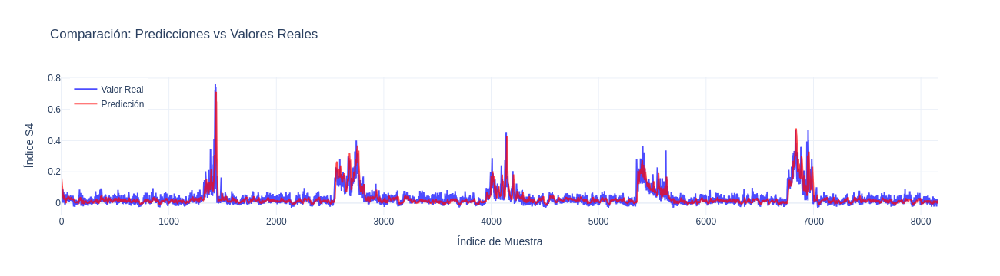

In [290]:
import plotly.graph_objects as go

# Crear el eje X basado en el índice de muestra
# Asegurarse de que sean arrays planos y del mismo tamaño
y_real = np.ravel(y_test_original)
y_pred = np.ravel(y_pred_original)
x_vals = list(range(len(y_test_original)))

# Crear figura interactiva
fig = go.Figure()

# Trazar valores reales
fig.add_trace(go.Scatter(
    x=x_vals,
    y=y_real,
    mode='lines',
    name='Valor Real',
    line=dict(color='blue'),
    opacity=0.7
))

# Trazar predicciones
fig.add_trace(go.Scatter(
    x=x_vals,
    y=y_pred,
    mode='lines',
    name='Predicción',
    line=dict(color='red'),
    opacity=0.7
))

# Personalización del gráfico
fig.update_layout(
    title='Comparación: Predicciones vs Valores Reales',
    xaxis_title='Índice de Muestra',
    yaxis_title='Índice S4',
    legend=dict(x=0.01, y=0.99),
    template='plotly_white',
    hovermode='x unified'
)

fig.show()

## **MODELO 3**

In [297]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

In [299]:
df.head()

,Tiempo,Cintilacion,TEC,ROTEC,ROTI,Kp_Index,Dst_Index,ap_Index,f10.7_Index,AE_Index,S4,Fecha
0,2025-01-28 00:01:00,0.0,71.649570,-0.006873,0.010323,20.0,-0.016667,7.0,166.3,97.8,0.093,2025-01-28
1,2025-01-28 00:02:00,0.0,71.544307,-0.006454,0.010285,20.0,-0.033333,7.0,166.3,98.6,0.080,2025-01-28
2,2025-01-28 00:03:00,0.0,71.439044,-0.006034,0.010248,20.0,-0.050000,7.0,166.3,99.4,0.122,2025-01-28
3,2025-01-28 00:04:00,0.0,71.333781,-0.005614,0.010211,20.0,-0.066667,7.0,166.3,100.2,0.080,2025-01-28
4,2025-01-28 00:05:00,0.0,71.228518,-0.005194,0.010174,20.0,-0.083333,7.0,166.3,101.0,0.086,2025-01-28


In [302]:
data =df[["Tiempo","S4"]]
data.head()

,Tiempo,S4
0,2025-01-28 00:01:00,0.093
1,2025-01-28 00:02:00,0.080
2,2025-01-28 00:03:00,0.122
3,2025-01-28 00:04:00,0.080
4,2025-01-28 00:05:00,0.086


In [305]:
# **SET_INDEX**
data.set_index('Tiempo', inplace=True)

In [308]:
# NORMALIZAR
scaler= MinMaxScaler()
data["S4_SCALED"]=scaler.fit_transform(data)

/tmp/ipykernel_412298/2850436299.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [311]:
data.head()

,S4,S4_SCALED
Tiempo,,
2025-01-28 00:01:00,0.093,0.039231
2025-01-28 00:02:00,0.080,0.028823
2025-01-28 00:03:00,0.122,0.062450
2025-01-28 00:04:00,0.080,0.028823
2025-01-28 00:05:00,0.086,0.033627


In [314]:
def create_multi_output_sequences(data, n_steps=90, output_steps=10, step=10):
    """
    Crea ventanas de entrada X y múltiples valores de salida y (multi-step forecast).

    data: array con la serie temporal (e.g., índice S4)
    n_steps: tamaño de la ventana de entrada
    output_steps: cuántos pasos futuros se desean predecir (e.g., 10 minutos)
    step: desplazamiento entre ventanas sucesivas

    Retorna:
    - X: [num_ventanas, n_steps]
    - y: [num_ventanas, output_steps]
    """
    X, y = [], []
    for i in range(0, len(data) - n_steps - output_steps + 1, step):
        X.append(data[i : i + n_steps])
        y.append(data[i + n_steps : i + n_steps + output_steps])
    return np.array(X), np.array(y)

In [317]:
n_steps = 30         # ventana de 90 minutos
output_steps = 5    # predecir los 10 minutos siguientes
step = 5            # avanzar cada 10 minutos entre ventanas

X, y = create_multi_output_sequences(
    data['S4_SCALED'].values,
    n_steps=n_steps,
    output_steps=output_steps,
    step=step
)

# División en entrenamiento y prueba
split = int(0.8 * len(X))
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

In [320]:
X_train.shape

(6528, 30)

In [322]:
y_train.shape

(6528, 5)

In [325]:
X_test.shape

(1633, 30)

In [327]:
y_test.shape

(1633, 5)

In [330]:
# Crear modelo LSTM
model = Sequential([
    LSTM(50, activation='relu', input_shape=(n_steps, 1)),
    Dense(5)
])
model.compile(optimizer='adam', loss='mse')

# Entrenar modelo
model.fit(X_train, y_train, epochs=5, batch_size=32, validation_split=0.2)

Epoch 1/5


/home/soporte/anaconda3/envs/s4_env/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



164/164 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0063 - val_loss: 0.0032
Epoch 2/5
164/164 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0017 - val_loss: 0.0028
Epoch 3/5
164/164 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0015 - val_loss: 0.0026
Epoch 4/5
164/164 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0016 - val_loss: 0.0026
Epoch 5/5
164/164 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0015 - val_loss: 0.0025


In [332]:
# Hacer predicciones
y_pred = model.predict(X_test)

52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


In [335]:
y_pred.shape

(1633, 5)

In [338]:
y_pred_inv = scaler.inverse_transform(y_pred)  # Volver a la escala original

In [341]:
y_pred_inv.shape

(1633, 5)

In [344]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

#y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1))
y_test_original = scaler.inverse_transform(y_test)
# Calcular métricas
mae = mean_absolute_error(y_test_original, y_pred_inv)
rmse = np.sqrt(mean_squared_error(y_test_original, y_pred_inv))
mape = mean_absolute_percentage_error(y_test_original, y_pred_inv)

print(f"MAE: {mae:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"MAPE: {mape:.3f}")

MAE: 0.029
RMSE: 0.049
MAPE: 0.186


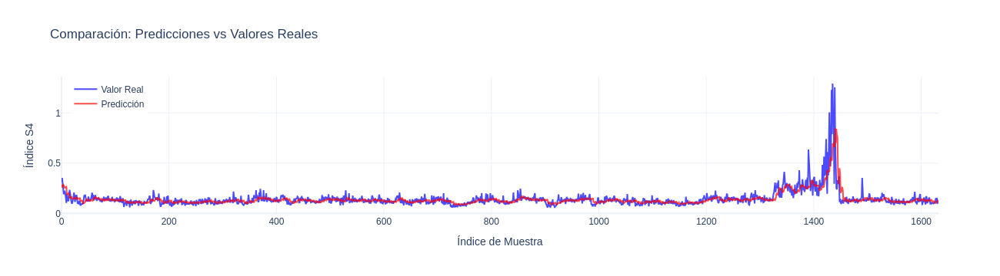

In [347]:
import plotly.graph_objects as go

# Crear el eje X basado en el índice de muestra
# Asegurarse de que sean arrays planos y del mismo tamaño
y_real = np.ravel(y_test_original)
y_pred = np.ravel(y_pred_inv)
x_vals = list(range(len(y_test_original)))

# Crear figura interactiva
fig = go.Figure()

# Trazar valores reales
fig.add_trace(go.Scatter(
    x=x_vals,
    y=y_real,
    mode='lines',
    name='Valor Real',
    line=dict(color='blue'),
    opacity=0.7
))

# Trazar predicciones
fig.add_trace(go.Scatter(
    x=x_vals,
    y=y_pred,
    mode='lines',
    name='Predicción',
    line=dict(color='red'),
    opacity=0.7
))

# Personalización del gráfico
fig.update_layout(
    title='Comparación: Predicciones vs Valores Reales',
    xaxis_title='Índice de Muestra',
    yaxis_title='Índice S4',
    legend=dict(x=0.01, y=0.99),
    template='plotly_white',
    hovermode='x unified'
)

fig.show()

# **MODELO 4**

In [353]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

In [356]:
data =df[["Tiempo","S4"]]


In [359]:
data.set_index('Tiempo', inplace=True)
# NORMALIZAR
scaler= MinMaxScaler()
data["S4_SCALED"]=scaler.fit_transform(data)
data.head()

/tmp/ipykernel_412298/417271402.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,S4,S4_SCALED
Tiempo,,
2025-01-28 00:01:00,0.093,0.039231
2025-01-28 00:02:00,0.080,0.028823
2025-01-28 00:03:00,0.122,0.062450
2025-01-28 00:04:00,0.080,0.028823
2025-01-28 00:05:00,0.086,0.033627


In [362]:
def create_multi_output_sequences(data, n_steps=90, output_steps=10, step=10):
    """
    Crea ventanas de entrada X y múltiples valores de salida y (multi-step forecast).

    data: array con la serie temporal (e.g., índice S4)
    n_steps: tamaño de la ventana de entrada
    output_steps: cuántos pasos futuros se desean predecir (e.g., 10 minutos)
    step: desplazamiento entre ventanas sucesivas

    Retorna:
    - X: [num_ventanas, n_steps]
    - y: [num_ventanas, output_steps]
    """
    X, y = [], []
    for i in range(0, len(data) - n_steps - output_steps + 1, step):
        X.append(data[i : i + n_steps])
        y.append(data[i + n_steps : i + n_steps + output_steps])
    return np.array(X), np.array(y)

In [365]:
n_steps = 90        # ventana de 90 minutos
output_steps = 5    # predecir los 10 minutos siguientes
step = 5            # avanzar cada 10 minutos entre ventanas

X, y = create_multi_output_sequences(
    data['S4_SCALED'].values,
    n_steps=n_steps,
    output_steps=output_steps,
    step=step
)

# División en entrenamiento y prueba
split = int(0.7 * len(X))
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

### **LSTM PARA PENALIZAR MAS LOS ERRRORES EN LOS PICOS**

In [370]:
import tensorflow.keras.backend as K

def peak_loss(y_true, y_pred):
    error = K.abs(y_true - y_pred)
    weight = K.cast(y_true > 0.5, 'float32') * 3.0 + 1.0  # peso alto si es pico
    return K.mean(weight * error)

In [373]:
# Crear modelo LSTM
#model = Sequential([
#    LSTM(50, activation='relu', input_shape=(n_steps, 9)),
#    Dense(1)
#])
model = Sequential([
    LSTM(128, return_sequences=True, input_shape=(n_steps, 1)),
    Dropout(0.2),#
    LSTM(64),#
    Dense(step)
])
model.compile(optimizer='adam', loss=peak_loss)

# Entrenar modelo
model.fit(X_train, y_train, epochs=5, batch_size=32, validation_split=0.2)

Epoch 1/5


/home/soporte/anaconda3/envs/s4_env/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0390 - val_loss: 0.0326
Epoch 2/5
143/143 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0285 - val_loss: 0.0318
Epoch 3/5
143/143 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0279 - val_loss: 0.0311
Epoch 4/5
143/143 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0281 - val_loss: 0.0304
Epoch 5/5
143/143 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0275 - val_loss: 0.0299


In [376]:
# Hacer predicciones
y_pred = model.predict(X_test)

77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [379]:
y_pred_inv = scaler.inverse_transform(y_pred)  # Volver a la escala original

In [382]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

y_test_original = scaler.inverse_transform(y_test)

# Calcular métricas
mae = mean_absolute_error(y_test_original, y_pred_inv)
rmse = np.sqrt(mean_squared_error(y_test_original, y_pred_inv))
mape = mean_absolute_percentage_error(y_test_original, y_pred_inv)

print(f"MAE: {mae:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"MAPE: {mape:.3f}")

MAE: 0.030
RMSE: 0.051
MAPE: 0.182


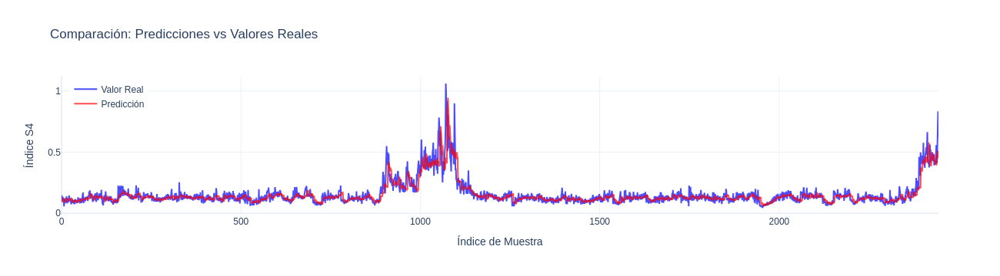

In [385]:
import plotly.graph_objects as go

# Crear el eje X basado en el índice de muestra
# Asegurarse de que sean arrays planos y del mismo tamaño
y_real = np.ravel(y_test_original)
y_pred = np.ravel(y_pred_inv)
x_vals = list(range(len(y_test_original)))

# Crear figura interactiva
fig = go.Figure()

# Trazar valores reales
fig.add_trace(go.Scatter(
    x=x_vals,
    y=y_real,
    mode='lines',
    name='Valor Real',
    line=dict(color='blue'),
    opacity=0.7
))

# Trazar predicciones
fig.add_trace(go.Scatter(
    x=x_vals,
    y=y_pred,
    mode='lines',
    name='Predicción',
    line=dict(color='red'),
    opacity=0.7
))

# Personalización del gráfico
fig.update_layout(
    title='Comparación: Predicciones vs Valores Reales',
    xaxis_title='Índice de Muestra',
    yaxis_title='Índice S4',
    legend=dict(x=0.01, y=0.99),
    template='plotly_white',
    hovermode='x unified'
)

fig.show()